# Banana Disease Detection Using Deep Learning

# Preprocessing

In [1]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt

In [2]:
import os 
os.environ['KMP_DUPLICATE_LIB_OK']='True'

In [3]:
import tensorflow.keras as keras

In [4]:
IMAGE_SIZE = 256
BATCH_SIZE = 32
CHANNELS = 3
EPOCHS = 50

In [5]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "Dataset",
    shuffle=True,
    image_size = (IMAGE_SIZE,IMAGE_SIZE),
    batch_size = BATCH_SIZE
)

Found 2028 files belonging to 3 classes.


In [6]:
class_names = dataset.class_names
class_names

['banana_sigatoka', 'banana_xanthomonas', 'healthy_banana']

In [7]:
len(dataset)

64

In [8]:
for image_batch, label_batch in dataset.take(1):
    print(image_batch.shape)
    print(label_batch.numpy())

(32, 256, 256, 3)
[0 1 1 0 2 2 1 2 1 0 2 0 2 0 1 2 1 0 1 2 1 1 1 1 0 1 0 2 0 0 1 1]


In [9]:
for image_batch, label_batch in dataset.take(1):
    print(image_batch[0])

tf.Tensor(
[[[ 39.  57.   5.]
  [ 41.  59.   7.]
  [ 44.  62.  10.]
  ...
  [ 43.  72.   8.]
  [ 44.  70.   9.]
  [ 43.  68.  10.]]

 [[ 34.  52.   0.]
  [ 37.  55.   3.]
  [ 41.  59.   7.]
  ...
  [ 45.  74.   8.]
  [ 46.  72.  11.]
  [ 45.  71.  10.]]

 [[ 28.  46.   0.]
  [ 32.  50.   0.]
  [ 37.  55.   3.]
  ...
  [ 49.  78.  12.]
  [ 49.  75.  12.]
  [ 47.  73.  10.]]

 ...

 [[ 46.  41.   3.]
  [ 46.  41.   3.]
  [ 44.  40.   2.]
  ...
  [ 66. 105.  22.]
  [ 31.  70.   5.]
  [ 11.  49.   0.]]

 [[ 46.  41.   3.]
  [ 45.  40.   2.]
  [ 44.  40.   2.]
  ...
  [ 84. 124.  36.]
  [ 44.  84.  14.]
  [ 18.  56.   0.]]

 [[ 46.  41.   3.]
  [ 45.  40.   2.]
  [ 43.  39.   1.]
  ...
  [ 93. 133.  44.]
  [ 49.  89.  18.]
  [ 18.  56.   0.]]], shape=(256, 256, 3), dtype=float32)


In [10]:
for image_batch, label_batch in dataset.take(1):
    print(image_batch[0].numpy())

[[[105. 132.  15.]
  [ 95. 121.  12.]
  [115. 140.  49.]
  ...
  [ 50.  63.  20.]
  [168. 180. 134.]
  [243. 255. 207.]]

 [[115. 142.  27.]
  [ 98. 124.  17.]
  [102. 127.  36.]
  ...
  [ 40.  53.  10.]
  [218. 230. 184.]
  [236. 248. 198.]]

 [[120. 146.  36.]
  [ 95. 120.  18.]
  [ 77. 101.  15.]
  ...
  [ 75.  88.  45.]
  [222. 234. 186.]
  [223. 236. 183.]]

 ...

 [[ 10.  21.   0.]
  [ 25.  35.  10.]
  [ 29.  36.  20.]
  ...
  [ 58.  68.  44.]
  [ 68.  78.  54.]
  [ 47.  57.  32.]]

 [[ 14.  24.   0.]
  [ 34.  44.  19.]
  [ 24.  31.  15.]
  ...
  [ 69.  79.  54.]
  [ 76.  86.  61.]
  [ 43.  53.  26.]]

 [[ 19.  29.   2.]
  [ 41.  51.  27.]
  [ 22.  29.  13.]
  ...
  [ 78.  88.  63.]
  [ 83.  93.  66.]
  [ 44.  54.  27.]]]


In [11]:
for image_batch, label_batch in dataset.take(1):
    print(image_batch[0].shape)

(256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


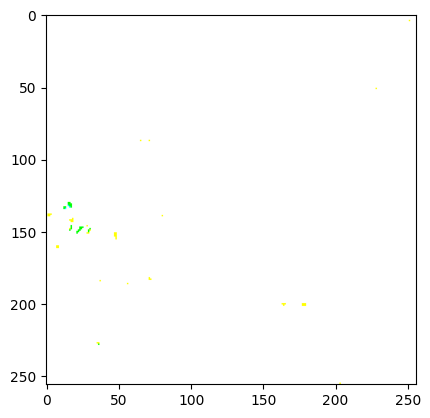

In [12]:
for image_batch, label_batch in dataset.take(1):
    plt.imshow(image_batch[0].numpy())

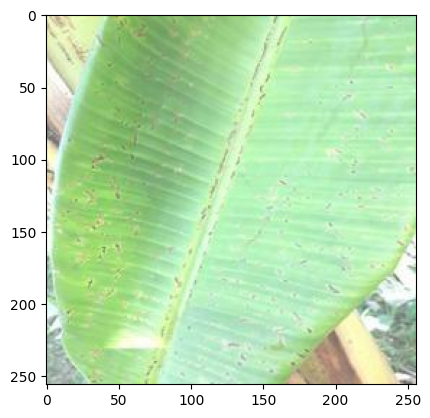

In [13]:
for image_batch, label_batch in dataset.take(1):
    plt.imshow(image_batch[0].numpy().astype("uint8"))

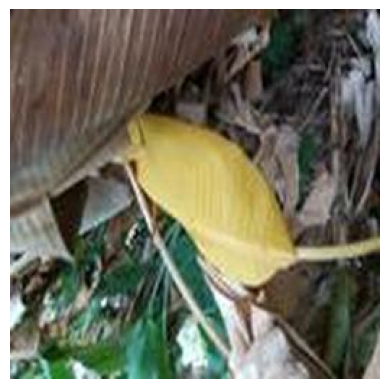

In [14]:
for image_batch, label_batch in dataset.take(1):
    plt.imshow(image_batch[0].numpy().astype("uint8"))
    plt.axis("off")

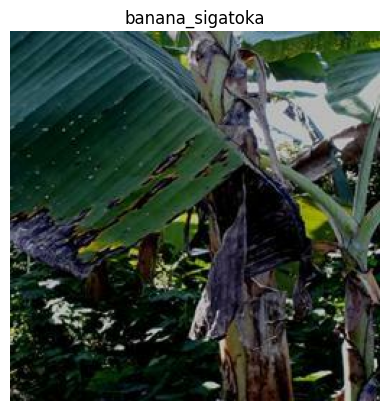

In [15]:
for image_batch, label_batch in dataset.take(1):
    plt.imshow(image_batch[0].numpy().astype("uint8"))
    plt.title(class_names[label_batch[0]])
    plt.axis("off")

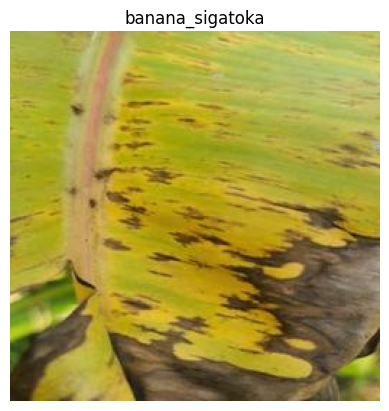

In [16]:
for image_batch, label_batch in dataset.take(1):
  for i in range(12):
    plt.imshow(image_batch[0].numpy().astype("uint8"))
    plt.title(class_names[label_batch[0]])
    plt.axis("off")

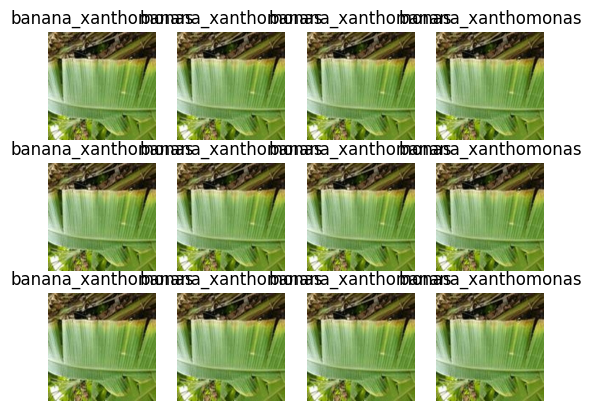

In [17]:
for image_batch, label_batch in dataset.take(1):
  for i in range(12):
    ax = plt.subplot(3,4,i+1)
    plt.imshow(image_batch[0].numpy().astype("uint8"))
    plt.title(class_names[label_batch[0]])
    plt.axis("off")

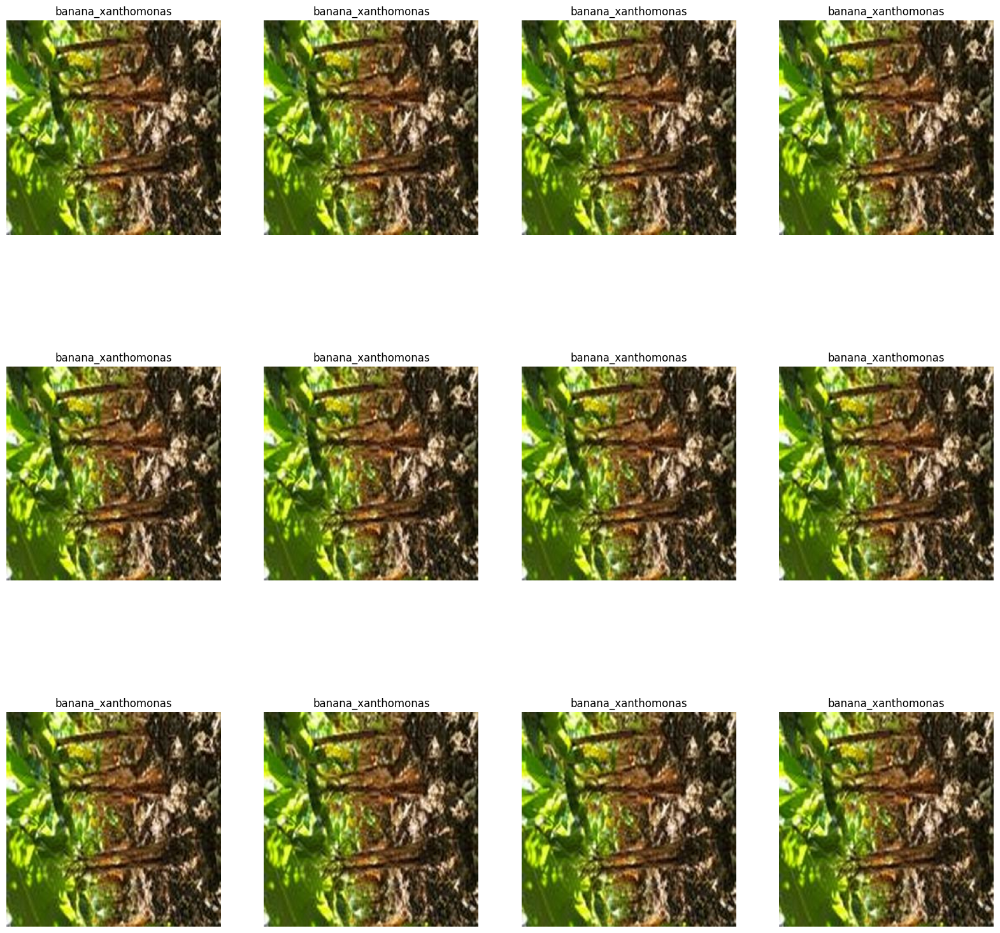

In [18]:
plt.figure(figsize=(20, 20))
for image_batch, label_batch in dataset.take(1):
  for i in range(12):
    ax = plt.subplot(3,4,i+1)
    plt.imshow(image_batch[0].numpy().astype("uint8"))
    plt.title(class_names[label_batch[0]])
    plt.axis("off")

In [19]:
len(dataset)

64

In [20]:
train_size = 0.8
len(dataset)*train_size

51.2

In [21]:
train_ds = dataset.take(51)
len(train_ds)

51

In [22]:
test_ds = dataset.skip(51)
len(test_ds)

13

In [23]:
val_size = 0.1
len(dataset)*val_size

6.4

In [24]:
val_ds = test_ds.take(6)
len(val_ds)

6

In [25]:
test_ds = test_ds.skip(3)
len(test_ds)

10

In [26]:
def get_dataset_partitions_tf(ds, train_split = 0.8, val_split=0.1, test_split = 0.1, shuffle=True, shuffle_size= 10000):

         ds_size = len(ds)

         if shuffle:
             ds = ds.shuffle(shuffle_size, seed=12)

         train_size = int(train_split * ds_size)
         val_size = int(val_split * ds_size)

         train_ds = ds.take(train_size)

         val_ds = ds.skip(train_size).take(val_size)
         test_ds = ds.skip(train_size).skip(val_size)

         return train_ds, val_ds, test_ds
    

In [27]:
train_ds, val_ds, test_ds = get_dataset_partitions_tf(dataset)

In [28]:
len(train_ds)

51

In [29]:
len(val_ds)

6

In [30]:
len(test_ds)

7

In [31]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

# Split data

In [32]:
from sklearn.model_selection import train_test_split
import os
import shutil

In [33]:
pip install -U scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [34]:
data_dir = 'Dataset'
train_dir = 'train'
test_dir = 'test'
valid_dir = 'valid'

In [35]:
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)
os.makedirs(valid_dir, exist_ok=True)

In [36]:
# Collect image file paths and labels
image_files = []
labels = []

for label in os.listdir(data_dir):
    label_dir = os.path.join(data_dir, label)
    for image_file in os.listdir(label_dir):
        image_files.append(os.path.join(label_dir, image_file))
        labels.append(label)

In [37]:
X_train, X_temp, y_train, y_temp = train_test_split(image_files, labels, test_size=0.4, random_state=42)
X_test, X_valid, y_test, y_valid = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

In [38]:
def copy_images(files, labels, dest_dir):
    for image, label in zip(files, labels):
        label_dir = os.path.join(dest_dir, label)
        os.makedirs(label_dir, exist_ok=True)
        shutil.copy(image, os.path.join(label_dir, os.path.basename(image)))

copy_images(X_train, y_train, train_dir)
copy_images(X_test, y_test, test_dir)
copy_images(X_valid, y_valid, valid_dir)

In [39]:
import os

dataset_dir = 'Dataset'

# Get a list of all subdirectories in the dataset directory, which represent classes or labels
labels = [label for label in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, label))]

# The 'labels' list now contains the class names or labels
print(labels)


['banana_sigatoka', 'banana_xanthomonas', 'healthy_banana']


In [40]:
resize_and_rescale = tf.keras.Sequential([
    layers.experimental.preprocessing.Resizing(IMAGE_SIZE, IMAGE_SIZE),
    layers.experimental.preprocessing.Rescaling(1.0/255)
])

In [41]:
data_augmentation = tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation(0.2)
])
    

In [42]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = 3

model = models.Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(32, (3,3), activation='relu', input_shape = input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation= 'softmax'),
])

model.build(input_shape=input_shape)

In [43]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (32, 256, 256, 3)         0         
                                                                 
 sequential_1 (Sequential)   (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 64)       0         
 2D)                                                  

In [44]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [45]:
history = model.fit(
    train_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    verbose=1,
    validation_data=val_ds
)

Epoch 1/50
51/51 [==============================] - 58s 1s/step - loss: 0.8935 - accuracy: 0.5833 - val_loss: 0.7206 - val_accuracy: 0.7292
Epoch 2/50
51/51 [==============================] - 46s 902ms/step - loss: 0.6457 - accuracy: 0.7151 - val_loss: 0.6991 - val_accuracy: 0.7083
Epoch 3/50
51/51 [==============================] - 43s 851ms/step - loss: 0.5615 - accuracy: 0.7745 - val_loss: 0.6058 - val_accuracy: 0.7604
Epoch 4/50
51/51 [==============================] - 43s 847ms/step - loss: 0.5110 - accuracy: 0.7972 - val_loss: 0.5576 - val_accuracy: 0.7604
Epoch 5/50
51/51 [==============================] - 43s 841ms/step - loss: 0.4167 - accuracy: 0.8450 - val_loss: 0.5016 - val_accuracy: 0.7969
Epoch 6/50
51/51 [==============================] - 44s 861ms/step - loss: 0.3903 - accuracy: 0.8517 - val_loss: 0.3438 - val_accuracy: 0.8646
Epoch 7/50
51/51 [==============================] - 48s 941ms/step - loss: 0.3383 - accuracy: 0.8670 - val_loss: 0.3917 - val_accuracy: 0.8438
Ep

In [46]:
scores = model.evaluate(test_ds)

7/7 [==============================] - 5s 305ms/step - loss: 0.1033 - accuracy: 0.9554


In [47]:
scores

[0.1032649353146553, 0.9553571343421936]

In [48]:
history

In [49]:
history.params

{'verbose': 1, 'epochs': 50, 'steps': 51}

In [50]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [51]:
history.history['accuracy']

[0.5833333134651184,
 0.7150735259056091,
 0.7745097875595093,
 0.7971813678741455,
 0.844975471496582,
 0.8517156839370728,
 0.8670343160629272,
 0.8829656839370728,
 0.9136029481887817,
 0.8933823704719543,
 0.8792892098426819,
 0.8952205777168274,
 0.9252451062202454,
 0.9215686321258545,
 0.938725471496582,
 0.9344362616539001,
 0.906862735748291,
 0.9424019455909729,
 0.9350489974021912,
 0.9405637383460999,
 0.9454656839370728,
 0.9620097875595093,
 0.9662989974021912,
 0.9466911554336548,
 0.9515931606292725,
 0.9626225233078003,
 0.9626225233078003,
 0.9662989974021912,
 0.9712010025978088,
 0.9656862616539001,
 0.9736519455909729,
 0.9761029481887817,
 0.9436274766921997,
 0.9509803652763367,
 0.96875,
 0.969975471496582,
 0.9718137383460999,
 0.9638480544090271,
 0.9626225233078003,
 0.9626225233078003,
 0.9785539507865906,
 0.9546568393707275,
 0.9810048937797546,
 0.9767156839370728,
 0.9810048937797546,
 0.9785539507865906,
 0.9797794222831726,
 0.9877451062202454,
 0.9895

In [52]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

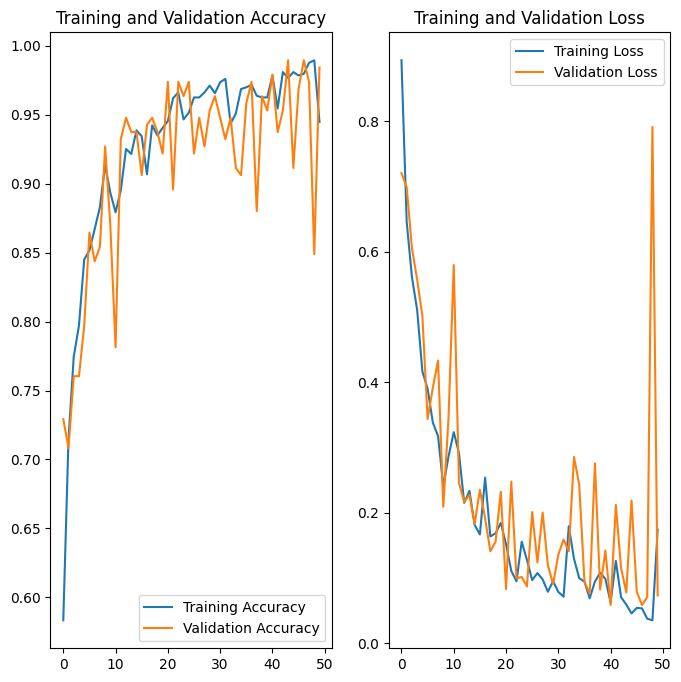

In [53]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


In [54]:
for images_batch, labels_batch in test_ds.take(1):
    print(images_batch[0])

tf.Tensor(
[[[ 45. 104.  38.]
  [ 44. 103.  37.]
  [ 39.  98.  32.]
  ...
  [157. 232. 227.]
  [179. 254. 247.]
  [178. 253. 246.]]

 [[ 47. 106.  40.]
  [ 46. 107.  40.]
  [ 43. 102.  36.]
  ...
  [165. 241. 239.]
  [184. 255. 255.]
  [182. 255. 254.]]

 [[ 44. 105.  38.]
  [ 45. 107.  40.]
  [ 43. 104.  37.]
  ...
  [ 91. 169. 173.]
  [ 92. 167. 173.]
  [ 83. 160. 166.]]

 ...

 [[177. 139. 130.]
  [169. 133. 119.]
  [212. 180. 157.]
  ...
  [ 50.  84.  67.]
  [ 41.  77.  63.]
  [ 42.  78.  66.]]

 [[114.  74.  64.]
  [162. 125. 109.]
  [160. 126. 101.]
  ...
  [ 50.  88.  67.]
  [ 42.  79.  62.]
  [ 37.  73.  59.]]

 [[102.  62.  50.]
  [137. 100.  82.]
  [106.  70.  44.]
  ...
  [ 56.  94.  71.]
  [ 48.  85.  68.]
  [ 37.  73.  59.]]], shape=(256, 256, 3), dtype=float32)


In [55]:
for images_batch, labels_batch in test_ds.take(1):
    print(images_batch[0].numpy())

[[[ 81.  86.  30.]
  [ 86.  91.  35.]
  [ 87.  95.  36.]
  ...
  [158. 193.  91.]
  [136. 177.  73.]
  [113. 156.  49.]]

 [[ 84.  89.  33.]
  [ 86.  94.  37.]
  [ 86.  94.  35.]
  ...
  [159. 194.  94.]
  [138. 179.  75.]
  [121. 164.  59.]]

 [[ 78.  86.  29.]
  [ 84.  92.  35.]
  [ 83.  91.  32.]
  ...
  [161. 195. 100.]
  [144. 182.  83.]
  [135. 176.  74.]]

 ...

 [[143. 124.  92.]
  [123. 104.  71.]
  [106.  87.  54.]
  ...
  [ 41.  29.  13.]
  [ 39.  30.  13.]
  [ 38.  30.  11.]]

 [[136. 113.  81.]
  [133. 110.  78.]
  [122. 102.  69.]
  ...
  [ 34.  23.   5.]
  [ 28.  20.   1.]
  [ 26.  18.   0.]]

 [[133. 108.  77.]
  [139. 114.  83.]
  [133. 110.  76.]
  ...
  [ 31.  20.   2.]
  [ 24.  16.   0.]
  [ 22.  14.   0.]]]


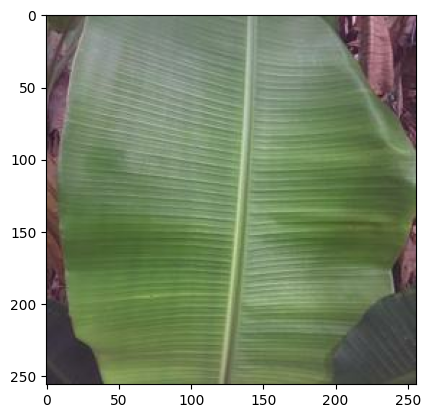

In [56]:
for images_batch, labels_batch in test_ds.take(1):
    plt.imshow(images_batch[0].numpy().astype('uint8'))

first image to predict
first image's actual label: 0


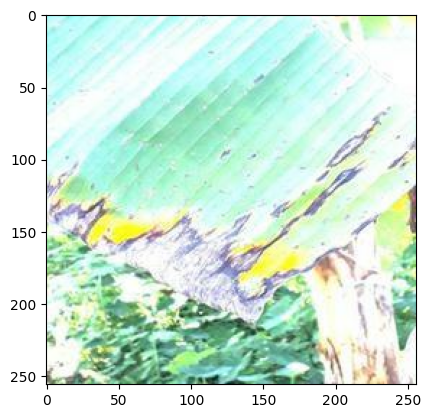

In [57]:
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("first image's actual label:",first_label)

first image to predict
first image's actual label: banana_sigatoka


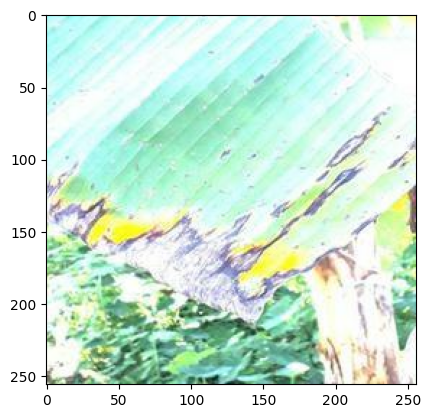

In [58]:
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("first image's actual label:",class_names[first_label])

first image to predict
actual label: banana_xanthomonas
1/1 [==============================] - 1s 507ms/step
[5.9606351e-05 9.9994034e-01 2.9563008e-10]


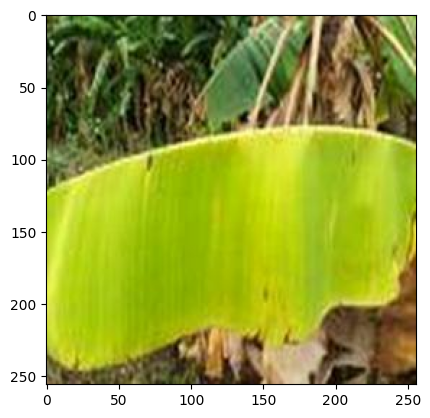

In [59]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])

    batch_prediction = model.predict(images_batch)
    print(batch_prediction[0])

In [61]:
np.argmax([5.9606351e-05, 9.9994034e-01, 2.9563008e-10])

1

first image to predict
actual label: banana_xanthomonas
1/1 [==============================] - 0s 211ms/step
predicted label: banana_xanthomonas


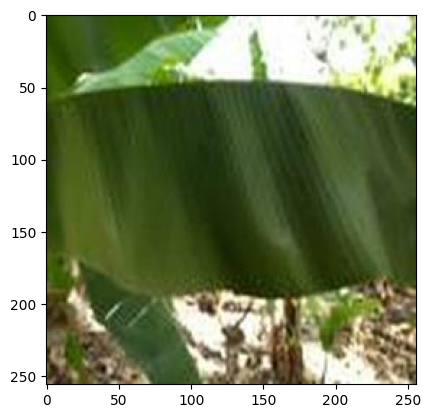

In [62]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])

    batch_prediction = model.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

In [63]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array,0) #create a batch

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence
    

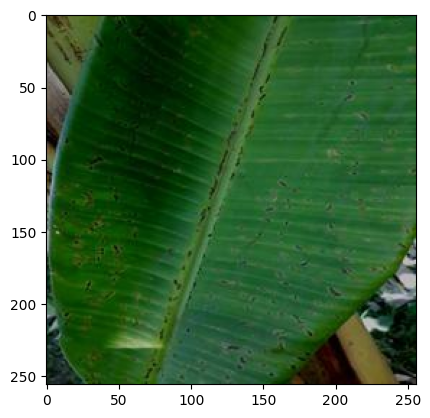

In [64]:
for images, labels in test_ds.take(1):
    for i in range(9):
        plt.imshow(images[i].numpy().astype('uint8'))

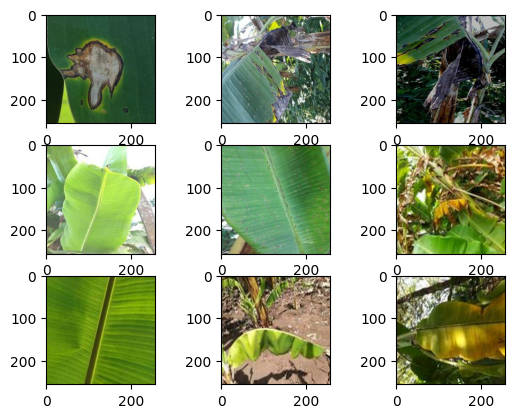

In [65]:
for images, label in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i+1)
        plt.imshow(images[i].numpy().astype('uint8'))

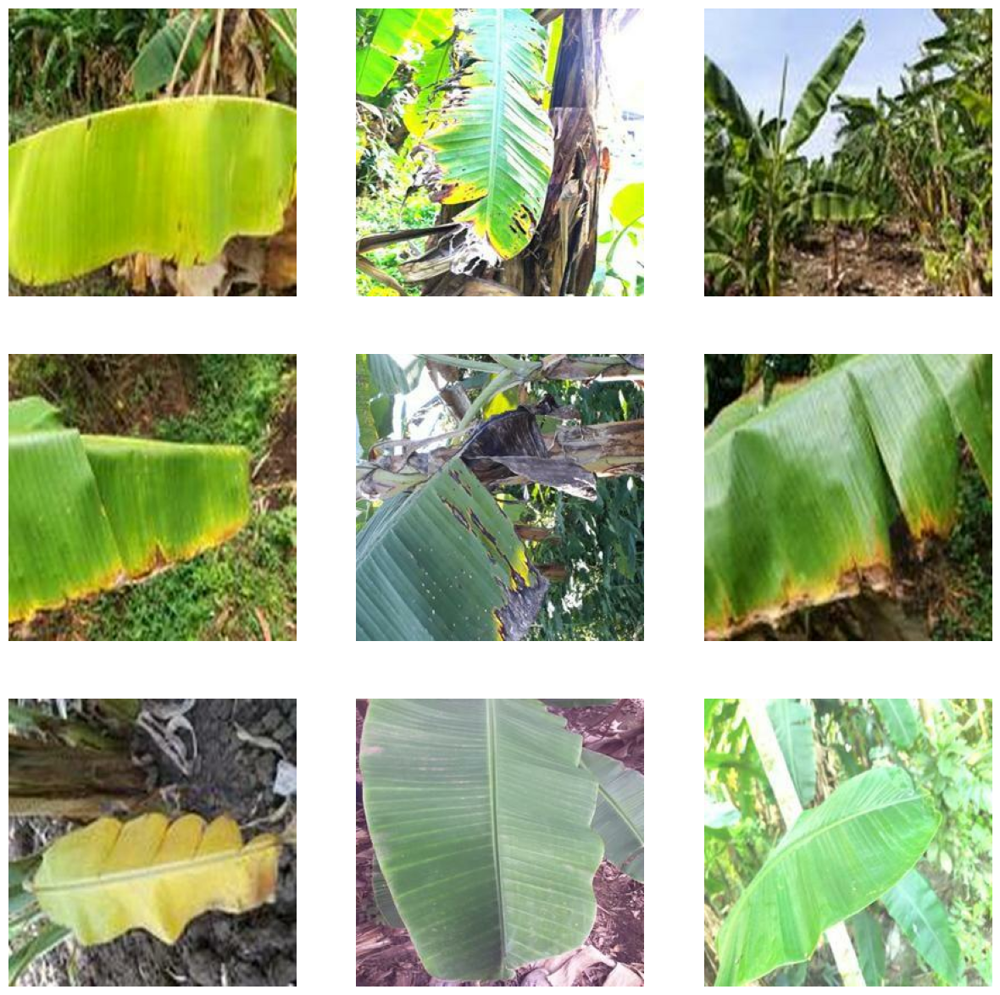

In [66]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i+1)
        plt.imshow(images[i].numpy().astype('uint8'))
        plt.axis("off")

1/1 [==============================] - 0s 35ms/step


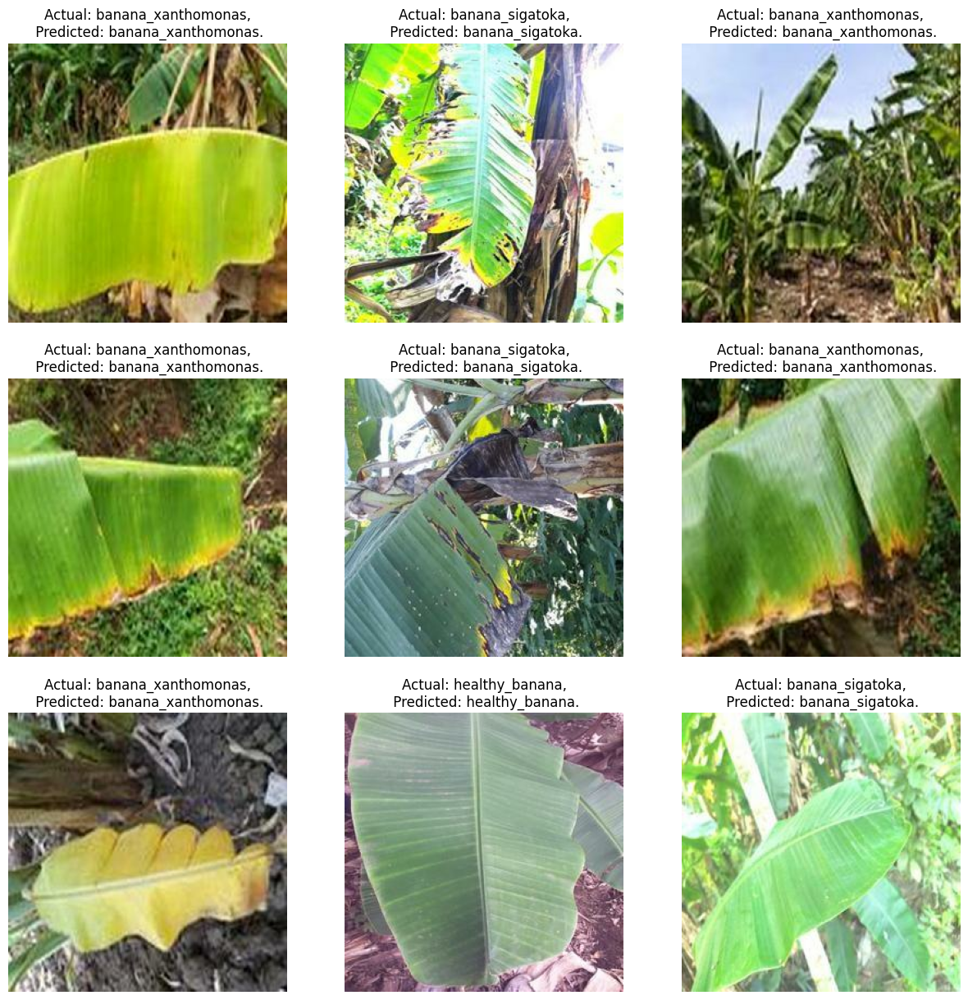

In [67]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i+1)
        plt.imshow(images[i].numpy().astype('uint8'))

        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.")
        
        plt.axis("off")

1/1 [==============================] - 0s 17ms/step


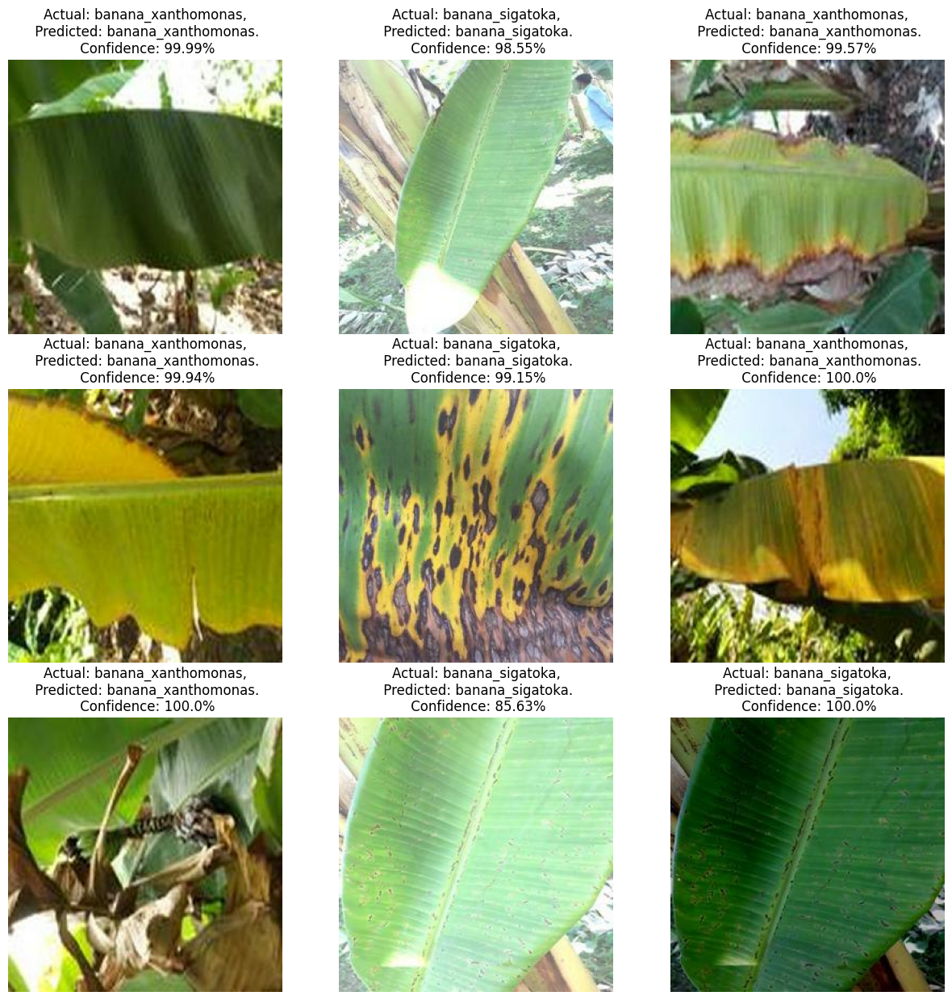

In [68]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i+1)
        plt.imshow(images[i].numpy().astype('uint8'))

        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

In [69]:
import os.path
if os.path.isfile('models/disease_model.h5') is False:
    model.save('models/disease_model.h5')

In [70]:
from tensorflow.keras.models import load_model
new_model = load_model('models/disease_model.h5')

In [71]:
new_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 256, 256, 3)       0         
                                                                 
 sequential_1 (Sequential)   (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 64)       0         
 2D)                                                  

In [72]:
new_model.get_weights()

[array([[[[ 1.77265611e-02, -1.50884241e-01,  2.14979108e-02,
           -2.90921424e-02, -1.13479622e-01, -1.29054144e-01,
           -1.46655113e-01, -5.52028082e-02, -8.39461535e-02,
           -1.25943333e-01, -1.65177099e-02, -1.22661667e-03,
           -1.24005347e-01, -1.81436259e-02,  1.37186855e-01,
            1.47783533e-01,  1.96324028e-02,  7.40650902e-03,
            1.02324255e-01, -1.82788298e-02,  1.07648931e-01,
            4.84870672e-02, -4.39011157e-02,  1.31164840e-03,
            2.74558328e-02,  4.00029607e-02, -2.05015659e-01,
            4.68355529e-02, -3.57012078e-02, -1.20883239e-02,
           -6.42982423e-02,  9.62761324e-03],
          [-1.71231210e-01, -4.56180573e-02, -5.91184199e-02,
            3.19464356e-02,  4.60135527e-02, -8.43411162e-02,
           -6.10074820e-03, -3.18520963e-02, -5.12160398e-02,
            1.18624054e-01, -1.07918411e-01, -1.10546604e-01,
           -1.29202336e-01,  1.61034539e-01,  5.41373678e-02,
           -8.07511285e-

In [73]:
new_model.optimizer

In [74]:
y_pred = model.predict(test_ds)

7/7 [==============================] - 2s 246ms/step
